# U-net

Segmentación semántica

<img src="./misc/u-net-architecture.png" width="75%">

In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms, utils
from torchvision.io import read_file, decode_jpeg, decode_png, ImageReadMode
import torchvision.transforms as T
import matplotlib.pyplot as plt
from torchvision.io import read_image
import torch
import torch.nn as nn

In [3]:
# DATASET
import os

# read dataset for u-net
class Dataset(Dataset):
    def __init__(self, data_dir, label_dir):
        self.data_dir = data_dir
        self.label_dir = label_dir
        self.files = [os.path.splitext(f)[0] for f in os.listdir(data_dir)]
        self.transform = T.Resize((512, 512))

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        file_name = self.files[idx]
        # read image
        image = read_image(os.path.join(self.data_dir, file_name + ".png"), mode=ImageReadMode.RGB)
        
        # read mask
        mask = read_image(os.path.join(self.label_dir, file_name + ".png"), mode=ImageReadMode.GRAY)
        
        # resize
        image = self.transform(image)
        mask = self.transform(mask)
        
        image = torch.tensor(image, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.float32)
        
        image = image / 255.0
        mask /= 255.0
        mask = torch.round(mask)

        return image, mask
        
ds_train = Dataset("images", "labels")
ds_loader_train = DataLoader(ds_train, batch_size=4)
        
ds_test = Dataset("test", "labels")
ds_loader_test = DataLoader(ds_test, batch_size=4)

In [6]:
import torch
import torch.nn as nn

""" Convolutional block:
    It follows a two 3x3 convolutional layer, each followed by a batch normalization and a relu activation.
"""
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)

        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)

        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

""" Encoder block:
    It consists of an conv_block followed by a max pooling.
    Here the number of filters doubles and the height and width half after every block.
"""
class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)

        return x, p

""" Decoder block:
    The decoder block begins with a transpose convolution, followed by a concatenation with the skip
    connection from the encoder block. Next comes the conv_block.
    Here the number filters decreases by half and the height and width doubles.
"""
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c+out_c, out_c)

    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.conv(x)

        return x


class build_unet(nn.Module):
    def __init__(self):
        super().__init__()

        """ Encoder """
        self.e1 = encoder_block(3, 64)
        self.e2 = encoder_block(64, 128)
        self.e3 = encoder_block(128, 256)
        self.e4 = encoder_block(256, 512)

        """ Bottleneck """
        self.b = conv_block(512, 1024)

        """ Decoder """
        self.d1 = decoder_block(1024, 512)
        self.d2 = decoder_block(512, 256)
        self.d3 = decoder_block(256, 128)
        self.d4 = decoder_block(128, 64)

        """ Classifier """
        self.outputs = nn.Conv2d(64, 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        """ Classifier """
        outputs = self.outputs(d4)

        return outputs

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

inputs = torch.randn((2, 3, 512, 512)).to(device)
model = build_unet().to(device)
y = model(inputs)
print(y.shape)

torch.Size([2, 1, 512, 512])


In [4]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),
                             lr=1e-3, 
                             weight_decay=1e-5)

In [5]:
num_epochs = 200

for epoch in range(num_epochs):
    for idx, (images, labels) in enumerate(ds_loader_train):
        # Forward pass
        outputs = model(images.to(device))
        loss = criterion(outputs, labels.to(device))
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        print("Lote:", idx)

    print (f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')



C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Lote: 0
Epoch [1/200], Loss: 0.2593
Lote: 0
Epoch [2/200], Loss: 0.3720
Lote: 0
Epoch [3/200], Loss: 0.1629
Lote: 0
Epoch [4/200], Loss: 0.0865
Lote: 0
Epoch [5/200], Loss: 0.0630
Lote: 0
Epoch [6/200], Loss: 0.0379
Lote: 0
Epoch [7/200], Loss: 0.0328
Lote: 0
Epoch [8/200], Loss: 0.0213
Lote: 0
Epoch [9/200], Loss: 0.0169
Lote: 0
Epoch [10/200], Loss: 0.0143
Lote: 0
Epoch [11/200], Loss: 0.0124
Lote: 0
Epoch [12/200], Loss: 0.0129
Lote: 0
Epoch [13/200], Loss: 0.0106
Lote: 0
Epoch [14/200], Loss: 0.0093
Lote: 0
Epoch [15/200], Loss: 0.0089
Lote: 0
Epoch [16/200], Loss: 0.0074
Lote: 0
Epoch [17/200], Loss: 0.0057
Lote: 0
Epoch [18/200], Loss: 0.0048
Lote: 0
Epoch [19/200], Loss: 0.0047
Lote: 0
Epoch [20/200], Loss: 0.0043
Lote: 0
Epoch [21/200], Loss: 0.0037
Lote: 0
Epoch [22/200], Loss: 0.0034
Lote: 0
Epoch [23/200], Loss: 0.0035
Lote: 0
Epoch [24/200], Loss: 0.0035
Lote: 0
Epoch [25/200], Loss: 0.0033
Lote: 0
Epoch [26/200], Loss: 0.0031
Lote: 0
Epoch [27/200], Loss: 0.0029
Lote: 0
Ep

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


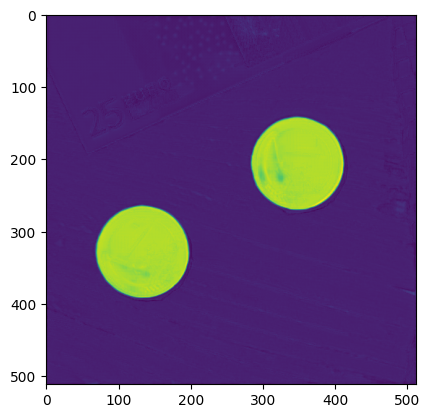

In [6]:
it = iter(ds_loader_test)
img, label = next(it)

model.eval()

ret = model(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

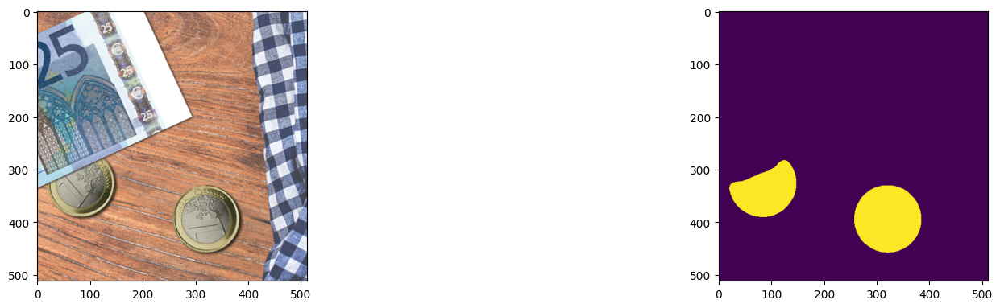

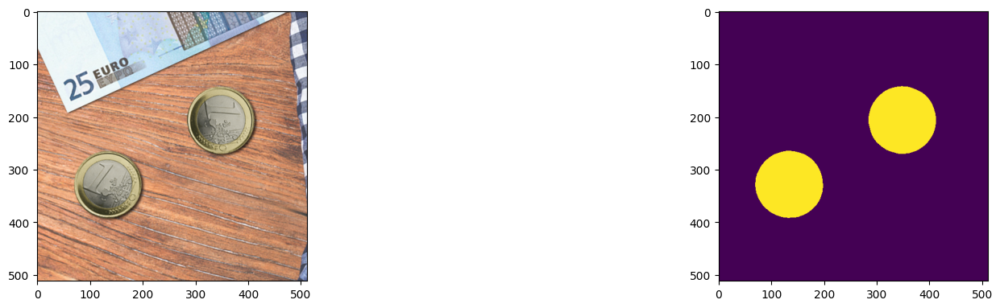

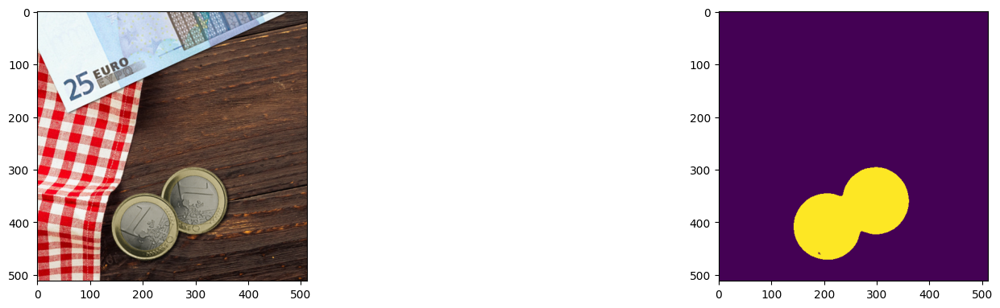

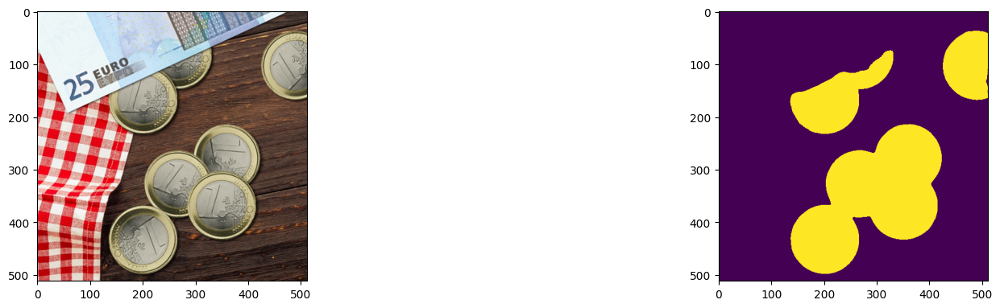

In [7]:

# Threshold the output
ret = torch.round(ret)

# Show a matrix of images of 4x2 
for i in range(4):
    # Size image
    plt.figure(figsize=(20, 20))
    plt.subplot(4, 2, 2*i+1)
    plt.imshow(img[i].permute(1, 2, 0).detach().cpu().numpy())
    plt.subplot(4, 2, 2*i+2)
    plt.imshow(ret[i][0].detach().cpu().numpy())


In [8]:
torch.save(model.state_dict(), "model_unet_coins.pth")

In [9]:
#model = build_unet()
model.load_state_dict(torch.load("model_unet_coins.pth"))

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\833238842.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("model_unet_coins.pth"))


<All keys matched successfully>

# simplificación de la de la red

In [12]:
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)

        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)

        self.relu = nn.ReLU()

    def forward(self, inputs, skip=None):
        # Manejo del skip directamente en conv_block
        if skip is not None:
            inputs = torch.cat([inputs, skip], axis=1)

        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)

        return x, p

class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c + out_c, out_c)

    def forward(self, inputs, skip=None):
        x = self.up(inputs)

        # Si hay un skip, concatenarlo; si no, usar solo x
        if skip is not None:
            x = torch.cat([x, skip], axis=1)
        else:
            x = torch.cat([x, torch.zeros_like(x)], axis=1)  # Asegurar compatibilidad dimensional
        
        x = self.conv(x)
        return x

In [13]:
class build_unet_simplified(nn.Module):
    def __init__(self):
        super().__init__()
    
        
        """ Encoder """
        self.e1 = encoder_block(3, 32)  # 3 -> base_filters
        self.e2 = encoder_block(32, 64)  # base_filters -> base_filters*2
        self.e3 = encoder_block(64, 128)  # ...
        self.e4 = encoder_block(128, 256)

        """ Bottleneck """
        self.b = conv_block(256, 512)

        """ Decoder """
        self.d1 = decoder_block(512, 256)
        self.d2 = decoder_block(256, 128)
        self.d3 = decoder_block(128, 64)
        self.d4 = decoder_block(64, 32)

        """ Classifier """
        self.outputs = nn.Conv2d(32, 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        """ Classifier """
        outputs = self.outputs(d4)

        return outputs


In [14]:
class build_unet_simplified2(nn.Module):
    def __init__(self):
        super().__init__()
    
        
        """ Encoder """
        self.e1 = encoder_block(3, 16)  # 3 -> base_filters
        self.e2 = encoder_block(16, 32)  # base_filters -> base_filters*2
        self.e3 = encoder_block(32, 64)  # ...
        self.e4 = encoder_block(64, 128)

        """ Bottleneck """
        self.b = conv_block(128, 256)

        """ Decoder """
        self.d1 = decoder_block(256, 128)
        self.d2 = decoder_block(128, 64)
        self.d3 = decoder_block(64, 32)
        self.d4 = decoder_block(32, 16)

        """ Classifier """
        self.outputs = nn.Conv2d(16, 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        """ Classifier """
        outputs = self.outputs(d4)

        return outputs

In [15]:
class build_unet_simplified3(nn.Module):
    def __init__(self):
        super().__init__()
    
        
        """ Encoder """
        self.e1 = encoder_block(3, 8)  # 3 -> base_filters
        self.e2 = encoder_block(8, 16)  # base_filters -> base_filters*2
        self.e3 = encoder_block(16, 32)  # ...
        self.e4 = encoder_block(32, 64)

        """ Bottleneck """
        self.b = conv_block(64, 128)

        """ Decoder """
        self.d1 = decoder_block(128, 64)
        self.d2 = decoder_block(64, 32)
        self.d3 = decoder_block(32, 16)
        self.d4 = decoder_block(16, 8)

        """ Classifier """
        self.outputs = nn.Conv2d(8, 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, None)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        """ Classifier """
        outputs = self.outputs(d4)

        return outputs

In [16]:
class build_unet_simplified4(nn.Module):
    def __init__(self):
        super().__init__()
    
        
        """ Encoder """
        self.e1 = encoder_block(3, 4)  # 3 -> base_filters
        self.e2 = encoder_block(4, 8)  # base_filters -> base_filters*2
        self.e3 = encoder_block(8, 16)  # ...
        self.e4 = encoder_block(16, 32)

        """ Bottleneck """
        self.b = conv_block(32, 64)

        """ Decoder """
        self.d1 = decoder_block(64, 32)
        self.d2 = decoder_block(32, 16)
        self.d3 = decoder_block(16, 8)
        self.d4 = decoder_block(8, 4)

        """ Classifier """
        self.outputs = nn.Conv2d(4, 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        """ Classifier """
        outputs = self.outputs(d4)

        return outputs

# Para model = build_unet_simplified()

In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

inputs1 = torch.randn((2, 3, 512, 512)).to(device)
model1 = build_unet_simplified()
y1 = model1(inputs1)
print(y1.shape)

torch.Size([2, 1, 512, 512])


In [18]:
criterion1 = nn.MSELoss()
optimizer1 = torch.optim.Adam(model1.parameters(),
                             lr=1e-3, 
                             weight_decay=1e-5)

In [27]:
num_epochs = 200

for epoch in range(num_epochs):
    for idx, (images, labels) in enumerate(ds_loader_train):
        # Forward pass
        outputs = model1(images.to(device))
        loss = criterion1(outputs, labels.to(device))
        
        # Backward and optimize
        optimizer1.zero_grad()
        loss.backward()
        optimizer1.step()
        print("Lote:", idx)

    print (f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Lote: 0
Epoch [1/200], Loss: 0.1072
Lote: 0
Epoch [2/200], Loss: 0.1119
Lote: 0
Epoch [3/200], Loss: 0.0950
Lote: 0
Epoch [4/200], Loss: 1.8465
Lote: 0
Epoch [5/200], Loss: 0.1043
Lote: 0
Epoch [6/200], Loss: 0.1120
Lote: 0
Epoch [7/200], Loss: 0.1119
Lote: 0
Epoch [8/200], Loss: 0.1071
Lote: 0
Epoch [9/200], Loss: 0.1011
Lote: 0
Epoch [10/200], Loss: 0.0969
Lote: 0
Epoch [11/200], Loss: 0.0962
Lote: 0
Epoch [12/200], Loss: 0.0979
Lote: 0
Epoch [13/200], Loss: 0.0982
Lote: 0
Epoch [14/200], Loss: 0.0961
Lote: 0
Epoch [15/200], Loss: 0.0949
Lote: 0
Epoch [16/200], Loss: 0.0925
Lote: 0
Epoch [17/200], Loss: 0.0885
Lote: 0
Epoch [18/200], Loss: 0.0857
Lote: 0
Epoch [19/200], Loss: 0.0836
Lote: 0
Epoch [20/200], Loss: 0.0816
Lote: 0
Epoch [21/200], Loss: 0.0794
Lote: 0
Epoch [22/200], Loss: 0.0769
Lote: 0
Epoch [23/200], Loss: 0.0743
Lote: 0
Epoch [24/200], Loss: 0.0719
Lote: 0
Epoch [25/200], Loss: 0.0694
Lote: 0
Epoch [26/200], Loss: 0.0669
Lote: 0
Epoch [27/200], Loss: 0.0646
Lote: 0
Ep

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


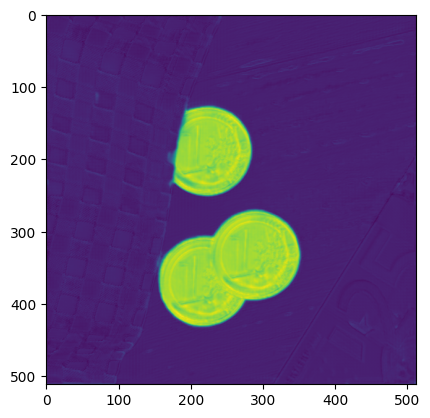

In [28]:
it = iter(ds_loader_train)
img, label = next(it)

model1.eval()

ret1 = model1(img.to(device))
plt.imshow(ret1[1][0].detach().cpu().numpy())

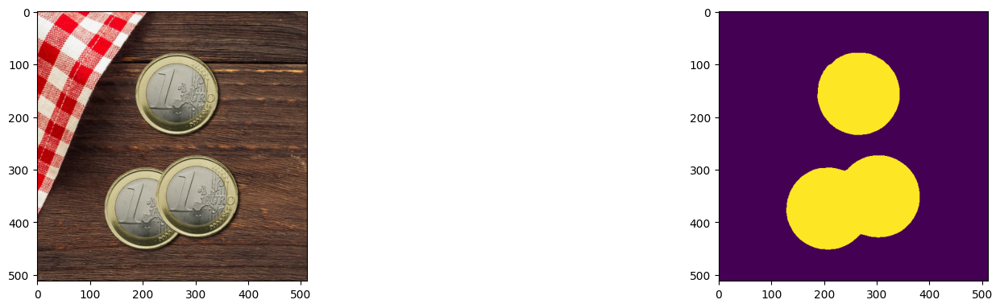

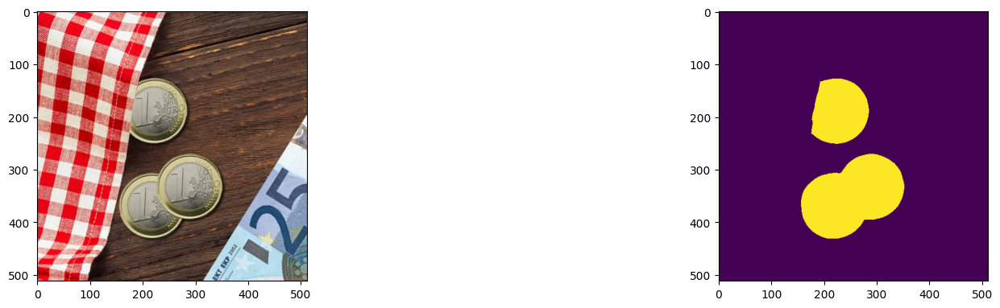

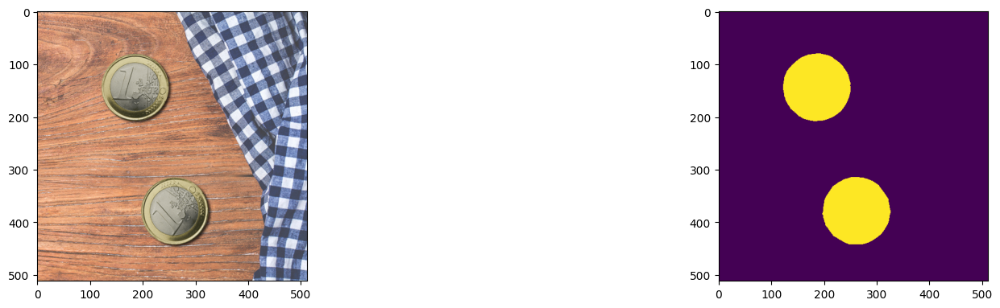

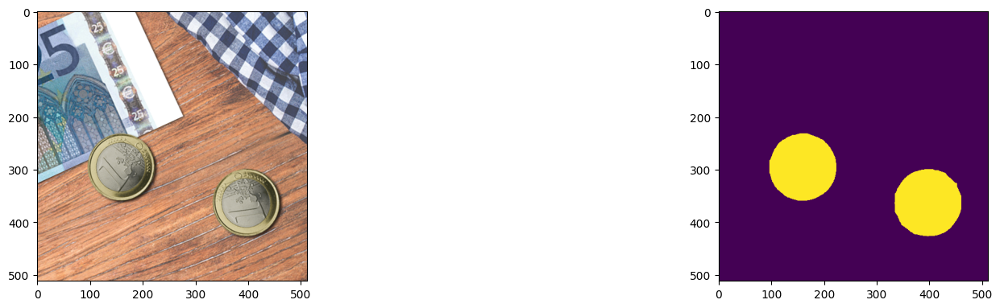

In [31]:
# Threshold the output
ret1 = torch.round(ret1)

# Show a matrix of images of 4x2 
for i in range(4):
    # Size image
    plt.figure(figsize=(20, 20))
    plt.subplot(4, 2, 2*i+1)
    plt.imshow(img[i].permute(1, 2, 0).detach().cpu().numpy())
    plt.subplot(4, 2, 2*i+2)
    plt.imshow(ret1[i][0].detach().cpu().numpy())


In [29]:
torch.save(model1.state_dict(), "model_unet_coins.pth")

In [30]:
model1.load_state_dict(torch.load("model_unet_coins.pth"))

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\113517197.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1.load_state_dict(torch.load("model_unet_coins.pth"))


<All keys matched successfully>

# Para model = build_unet_simplified2()

In [32]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

inputs2 = torch.randn((2, 3, 512, 512)).to(device)
model2 = build_unet_simplified2()
y2 = model2(inputs2)
print(y2.shape)

torch.Size([2, 1, 512, 512])


In [33]:
criterion2 = nn.MSELoss()
optimizer2 = torch.optim.Adam(model2.parameters(),
                             lr=1e-3, 
                             weight_decay=1e-5)
                            

In [34]:
num_epochs = 200

for epoch in range(num_epochs):
    for idx, (images, labels) in enumerate(ds_loader_train):
        # Forward pass
        outputs = model2(images.to(device))
        loss = criterion2(outputs, labels.to(device))
        
        # Backward and optimize
        optimizer2.zero_grad()
        loss.backward()
        optimizer2.step()
        print("Lote:", idx)

    print (f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Lote: 0
Epoch [1/200], Loss: 0.3016
Lote: 0
Epoch [2/200], Loss: 0.2280
Lote: 0
Epoch [3/200], Loss: 0.1650
Lote: 0
Epoch [4/200], Loss: 0.1182
Lote: 0
Epoch [5/200], Loss: 0.0820
Lote: 0
Epoch [6/200], Loss: 0.0558
Lote: 0
Epoch [7/200], Loss: 0.0406
Lote: 0
Epoch [8/200], Loss: 0.0318
Lote: 0
Epoch [9/200], Loss: 0.0238
Lote: 0
Epoch [10/200], Loss: 0.0201
Lote: 0
Epoch [11/200], Loss: 0.0155
Lote: 0
Epoch [12/200], Loss: 0.0131
Lote: 0
Epoch [13/200], Loss: 0.0106
Lote: 0
Epoch [14/200], Loss: 0.0094
Lote: 0
Epoch [15/200], Loss: 0.0087
Lote: 0
Epoch [16/200], Loss: 0.0079
Lote: 0
Epoch [17/200], Loss: 0.0074
Lote: 0
Epoch [18/200], Loss: 0.0072
Lote: 0
Epoch [19/200], Loss: 0.0068
Lote: 0
Epoch [20/200], Loss: 0.0065
Lote: 0
Epoch [21/200], Loss: 0.0063
Lote: 0
Epoch [22/200], Loss: 0.0059
Lote: 0
Epoch [23/200], Loss: 0.0055
Lote: 0
Epoch [24/200], Loss: 0.0054
Lote: 0
Epoch [25/200], Loss: 0.0052
Lote: 0
Epoch [26/200], Loss: 0.0049
Lote: 0
Epoch [27/200], Loss: 0.0047
Lote: 0
Ep

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


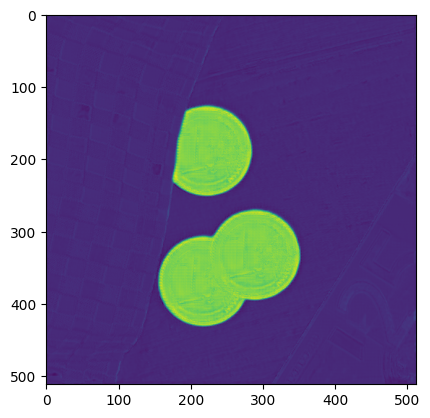

In [35]:
it = iter(ds_loader_train)
img, label = next(it)

model2.eval()

ret2 = model2(img.to(device))
plt.imshow(ret2[1][0].detach().cpu().numpy())

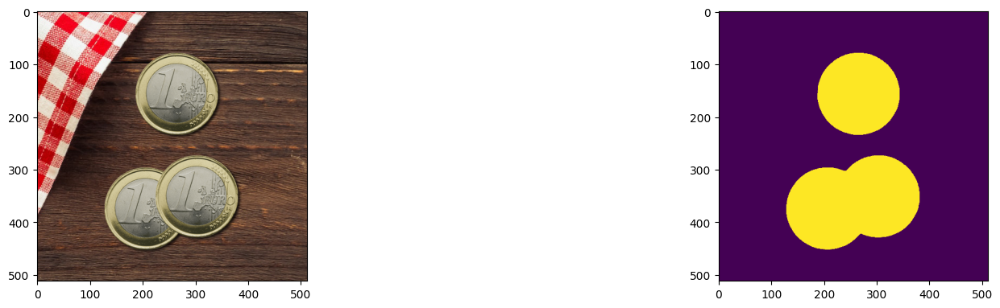

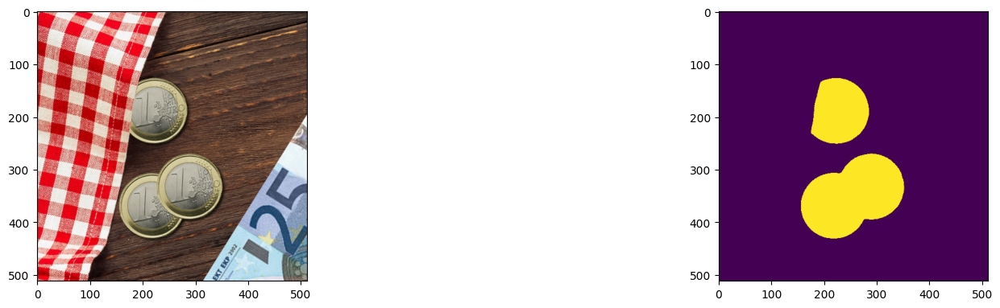

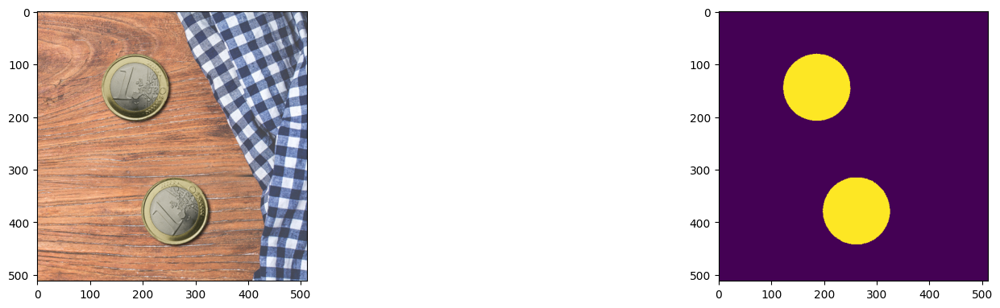

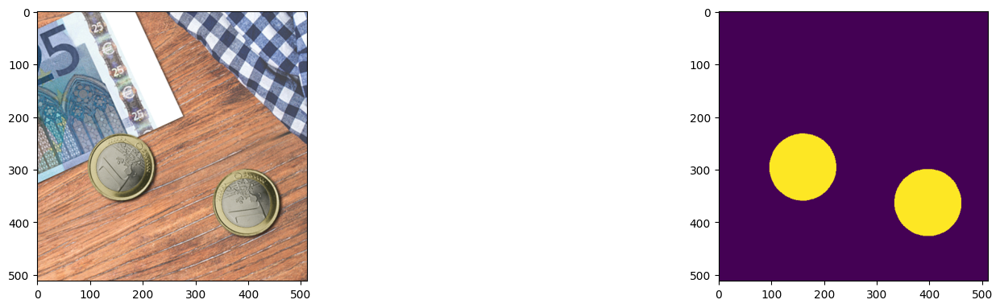

In [36]:
# Threshold the output
ret2 = torch.round(ret2)

# Show a matrix of images of 4x2 
for i in range(4):
    # Size image
    plt.figure(figsize=(20, 20))
    plt.subplot(4, 2, 2*i+1)
    plt.imshow(img[i].permute(1, 2, 0).detach().cpu().numpy())
    plt.subplot(4, 2, 2*i+2)
    plt.imshow(ret2[i][0].detach().cpu().numpy())


In [37]:
torch.save(model2.state_dict(), "model_unet_coins.pth")

In [38]:
model2.load_state_dict(torch.load("model_unet_coins.pth"))

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\2895448941.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model2.load_state_dict(torch.load("model_unet_coins.pth"))


<All keys matched successfully>

# Para model = build_unet_simplified3()

In [39]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

inputs3 = torch.randn((2, 3, 512, 512)).to(device)
model3 = build_unet_simplified3()
y3 = model3(inputs3)
print(y3.shape)

torch.Size([2, 1, 512, 512])


In [40]:
criterion3 = nn.MSELoss()
optimizer3 = torch.optim.Adam(model3.parameters(),
                             lr=1e-3, 
                             weight_decay=1e-5)
                            

In [41]:
num_epochs = 200

for epoch in range(num_epochs):
    for idx, (images, labels) in enumerate(ds_loader_train):
        # Forward pass
        outputs = model3(images.to(device))
        loss = criterion3(outputs, labels.to(device))
        
        # Backward and optimize
        optimizer3.zero_grad()
        loss.backward()
        optimizer3.step()
        print("Lote:", idx)

    print (f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Lote: 0
Epoch [1/200], Loss: 0.3597
Lote: 0
Epoch [2/200], Loss: 0.2709
Lote: 0
Epoch [3/200], Loss: 0.2239
Lote: 0
Epoch [4/200], Loss: 0.1969
Lote: 0
Epoch [5/200], Loss: 0.1726
Lote: 0
Epoch [6/200], Loss: 0.1475
Lote: 0
Epoch [7/200], Loss: 0.1248
Lote: 0
Epoch [8/200], Loss: 0.1063
Lote: 0
Epoch [9/200], Loss: 0.0896
Lote: 0
Epoch [10/200], Loss: 0.0755
Lote: 0
Epoch [11/200], Loss: 0.0634
Lote: 0
Epoch [12/200], Loss: 0.0544
Lote: 0
Epoch [13/200], Loss: 0.0470
Lote: 0
Epoch [14/200], Loss: 0.0404
Lote: 0
Epoch [15/200], Loss: 0.0348
Lote: 0
Epoch [16/200], Loss: 0.0301
Lote: 0
Epoch [17/200], Loss: 0.0263
Lote: 0
Epoch [18/200], Loss: 0.0229
Lote: 0
Epoch [19/200], Loss: 0.0199
Lote: 0
Epoch [20/200], Loss: 0.0177
Lote: 0
Epoch [21/200], Loss: 0.0157
Lote: 0
Epoch [22/200], Loss: 0.0140
Lote: 0
Epoch [23/200], Loss: 0.0126
Lote: 0
Epoch [24/200], Loss: 0.0114
Lote: 0
Epoch [25/200], Loss: 0.0103
Lote: 0
Epoch [26/200], Loss: 0.0093
Lote: 0
Epoch [27/200], Loss: 0.0087
Lote: 0
Ep

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


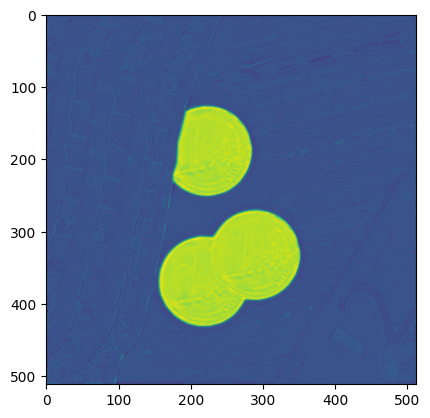

In [44]:
it = iter(ds_loader_train)
img, label = next(it)

model3.eval()

ret3 = model3(img.to(device))
plt.imshow(ret3[1][0].detach().cpu().numpy())

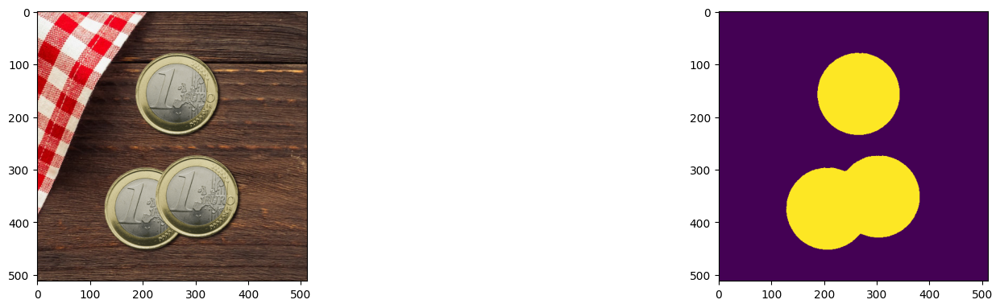

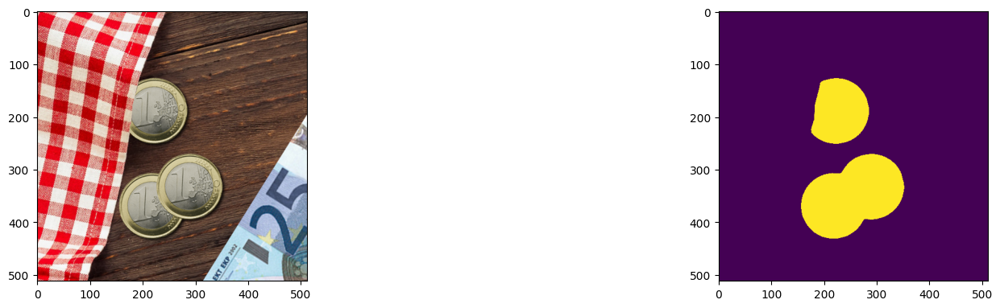

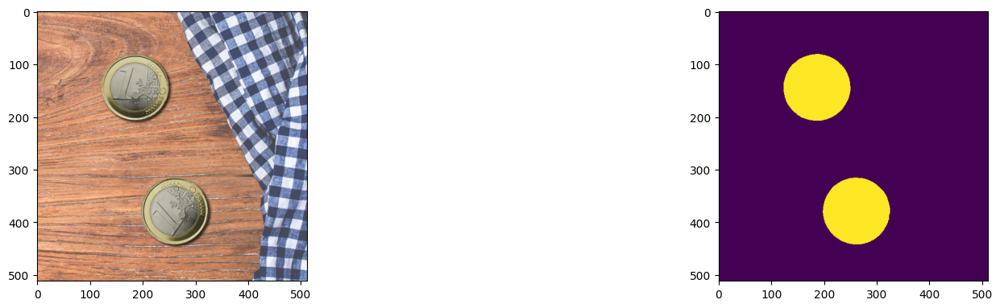

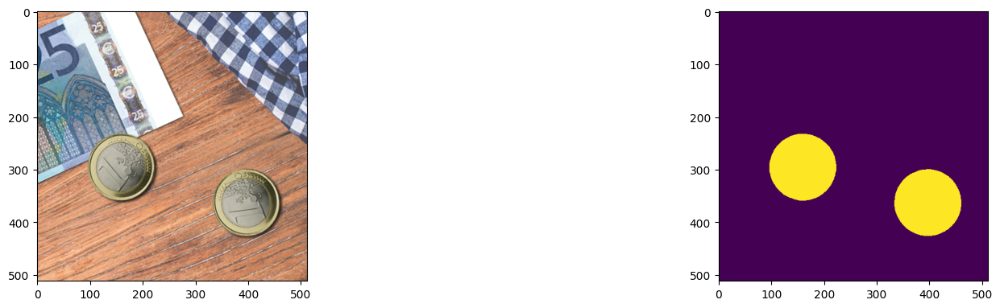

In [45]:
# Threshold the output
ret3 = torch.round(ret3)

# Show a matrix of images of 4x2 
for i in range(4):
    # Size image
    plt.figure(figsize=(20, 20))
    plt.subplot(4, 2, 2*i+1)
    plt.imshow(img[i].permute(1, 2, 0).detach().cpu().numpy())
    plt.subplot(4, 2, 2*i+2)
    plt.imshow(ret3[i][0].detach().cpu().numpy())


In [46]:
torch.save(model3.state_dict(), "model_unet_coins.pth")

In [47]:
model3.load_state_dict(torch.load("model_unet_coins.pth"))

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\236716538.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model3.load_state_dict(torch.load("model_unet_coins.pth"))


<All keys matched successfully>

# Para model = build_unet_simplified4()

In [48]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

inputs = torch.randn((2, 3, 512, 512)).to(device)
model = build_unet_simplified4()
y = model(inputs)
print(y.shape)

torch.Size([2, 1, 512, 512])


In [49]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),
                             lr=1e-3, 
                             weight_decay=1e-5)
                            

In [50]:
num_epochs = 200

for epoch in range(num_epochs):
    for idx, (images, labels) in enumerate(ds_loader_train):
        # Forward pass
        outputs = model(images.to(device))
        loss = criterion(outputs, labels.to(device))
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        print("Lote:", idx)

    print (f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Lote: 0
Epoch [1/200], Loss: 0.3160
Lote: 0
Epoch [2/200], Loss: 0.2786
Lote: 0
Epoch [3/200], Loss: 0.2492
Lote: 0
Epoch [4/200], Loss: 0.2269
Lote: 0
Epoch [5/200], Loss: 0.2095
Lote: 0
Epoch [6/200], Loss: 0.1954
Lote: 0
Epoch [7/200], Loss: 0.1838
Lote: 0
Epoch [8/200], Loss: 0.1735
Lote: 0
Epoch [9/200], Loss: 0.1636
Lote: 0
Epoch [10/200], Loss: 0.1532
Lote: 0
Epoch [11/200], Loss: 0.1421
Lote: 0
Epoch [12/200], Loss: 0.1307
Lote: 0
Epoch [13/200], Loss: 0.1196
Lote: 0
Epoch [14/200], Loss: 0.1088
Lote: 0
Epoch [15/200], Loss: 0.0987
Lote: 0
Epoch [16/200], Loss: 0.0895
Lote: 0
Epoch [17/200], Loss: 0.0811
Lote: 0
Epoch [18/200], Loss: 0.0734
Lote: 0
Epoch [19/200], Loss: 0.0661
Lote: 0
Epoch [20/200], Loss: 0.0593
Lote: 0
Epoch [21/200], Loss: 0.0530
Lote: 0
Epoch [22/200], Loss: 0.0476
Lote: 0
Epoch [23/200], Loss: 0.0428
Lote: 0
Epoch [24/200], Loss: 0.0388
Lote: 0
Epoch [25/200], Loss: 0.0353
Lote: 0
Epoch [26/200], Loss: 0.0321
Lote: 0
Epoch [27/200], Loss: 0.0291
Lote: 0
Ep

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_10032\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


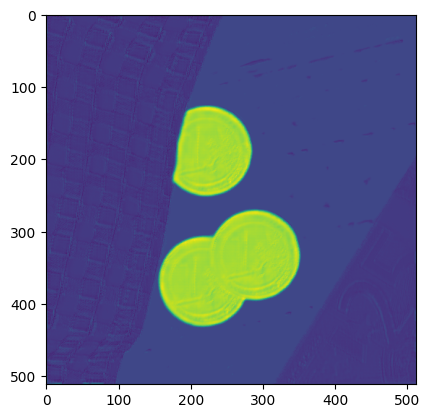

In [51]:
it = iter(ds_loader_train)
img, label = next(it)

model.eval()

ret = model(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

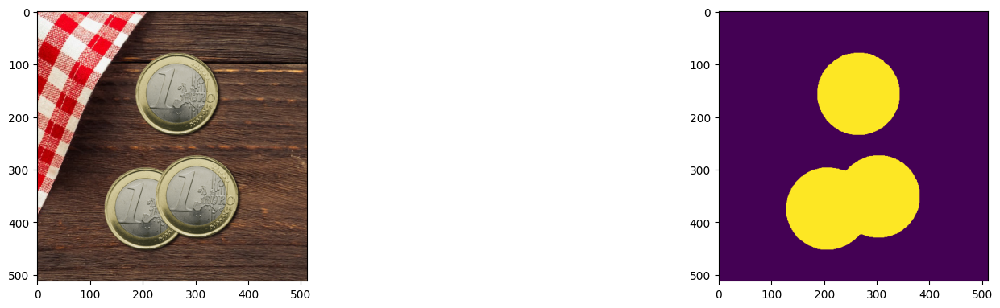

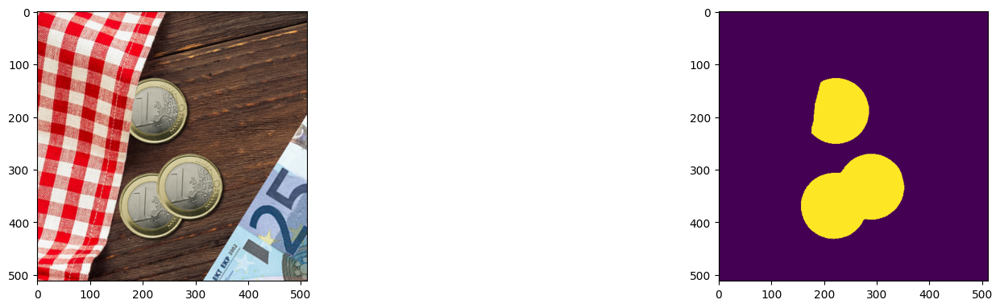

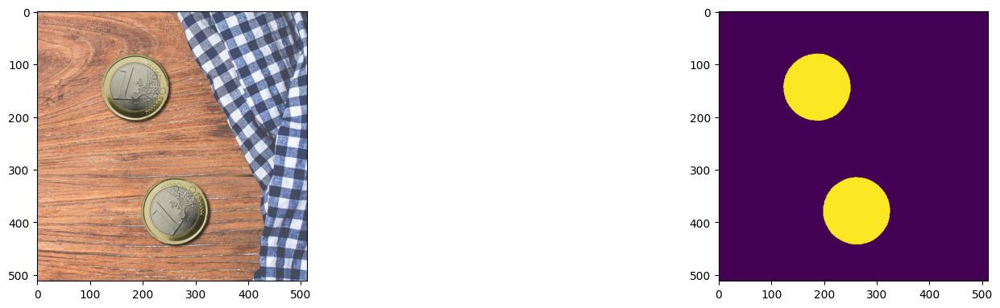

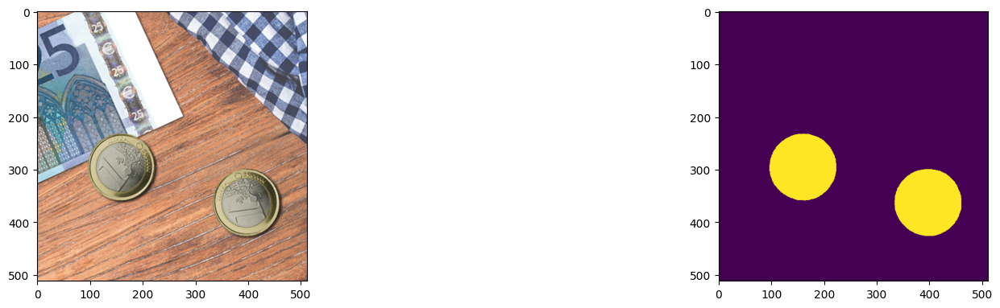

In [52]:
# Threshold the output
ret = torch.round(ret)

# Show a matrix of images of 4x2 
for i in range(4):
    # Size image
    plt.figure(figsize=(20, 20))
    plt.subplot(4, 2, 2*i+1)
    plt.imshow(img[i].permute(1, 2, 0).detach().cpu().numpy())
    plt.subplot(4, 2, 2*i+2)
    plt.imshow(ret[i][0].detach().cpu().numpy())


In [53]:
torch.save(model.state_dict(), "model_unet_coins.pth")

In [54]:
model.load_state_dict(torch.load("model_unet_coins.pth"))

C:\Users\INES\AppData\Local\Temp\ipykernel_10032\746586838.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("model_unet_coins.pth"))


<All keys matched successfully>

# Modelo Simplified 2 sin Skip Connections

In [12]:
class decoder_block_no_skip(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c, out_c)

    def forward(self, inputs):
        x = self.up(inputs)
        x = self.conv(x)

        return x


In [15]:
class build_unet_no_skip(nn.Module):
    def __init__(self):
        super().__init__()

        """ Encoder """
        self.e1 = encoder_block(3, 64)
        self.e2 = encoder_block(64, 128)
        self.e3 = encoder_block(128, 256)
        self.e4 = encoder_block(256, 512)

        """ Bottleneck """
        self.b = conv_block(512, 1024)

        """ Decoder """
        self.d1 = decoder_block_no_skip(1024, 512)
        self.d2 = decoder_block_no_skip(512, 256)
        self.d3 = decoder_block_no_skip(256, 128)
        self.d4 = decoder_block_no_skip(128, 64)

        """ Classifier """
        self.outputs = nn.Conv2d(64, 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        _, p1 = self.e1(inputs)
        _, p2 = self.e2(p1)
        _, p3 = self.e3(p2)
        _, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b)
        d2 = self.d2(d1)
        d3 = self.d3(d2)
        d4 = self.d4(d3)

        """ Classifier """
        outputs = self.outputs(d4)

        return outputs


In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

inputs = torch.randn((2, 3, 512, 512)).to(device)
model_no_skip = build_unet_no_skip().to(device)
y_no_skip = model_no_skip(inputs)
print(y_no_skip.shape)

torch.Size([2, 1, 512, 512])


In [17]:
criterion_no_skip = nn.MSELoss()
optimizer_no_skip = torch.optim.Adam(model_no_skip.parameters(),
                             lr=1e-3, 
                             weight_decay=1e-5)
                            

In [18]:
num_epochs = 200

for epoch in range(num_epochs):
    for idx, (images, labels) in enumerate(ds_loader_train):
        # Forward pass
        outputs = model_no_skip(images.to(device))
        loss = criterion_no_skip(outputs, labels.to(device))
        
        # Backward and optimize
        optimizer_no_skip.zero_grad()
        loss.backward()
        optimizer_no_skip.step()
        print("Lote:", idx)

    print (f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')


C:\Users\INES\AppData\Local\Temp\ipykernel_18088\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_18088\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Lote: 0
Epoch [1/200], Loss: 0.5031
Lote: 0
Epoch [2/200], Loss: 0.6220
Lote: 0
Epoch [3/200], Loss: 0.3277
Lote: 0
Epoch [4/200], Loss: 0.1436
Lote: 0
Epoch [5/200], Loss: 0.1121
Lote: 0
Epoch [6/200], Loss: 0.0869
Lote: 0
Epoch [7/200], Loss: 0.0818
Lote: 0
Epoch [8/200], Loss: 0.0702
Lote: 0
Epoch [9/200], Loss: 0.0474
Lote: 0
Epoch [10/200], Loss: 0.0366
Lote: 0
Epoch [11/200], Loss: 0.0301
Lote: 0
Epoch [12/200], Loss: 0.0261
Lote: 0
Epoch [13/200], Loss: 0.0192
Lote: 0
Epoch [14/200], Loss: 0.0181
Lote: 0
Epoch [15/200], Loss: 0.0171
Lote: 0
Epoch [16/200], Loss: 0.0162
Lote: 0
Epoch [17/200], Loss: 0.0164
Lote: 0
Epoch [18/200], Loss: 0.0146
Lote: 0
Epoch [19/200], Loss: 0.0134
Lote: 0
Epoch [20/200], Loss: 0.0135
Lote: 0
Epoch [21/200], Loss: 0.0129
Lote: 0
Epoch [22/200], Loss: 0.0116
Lote: 0
Epoch [23/200], Loss: 0.0111
Lote: 0
Epoch [24/200], Loss: 0.0108
Lote: 0
Epoch [25/200], Loss: 0.0103
Lote: 0
Epoch [26/200], Loss: 0.0102
Lote: 0
Epoch [27/200], Loss: 0.0100
Lote: 0
Ep

C:\Users\INES\AppData\Local\Temp\ipykernel_18088\4029706096.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\INES\AppData\Local\Temp\ipykernel_18088\4029706096.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


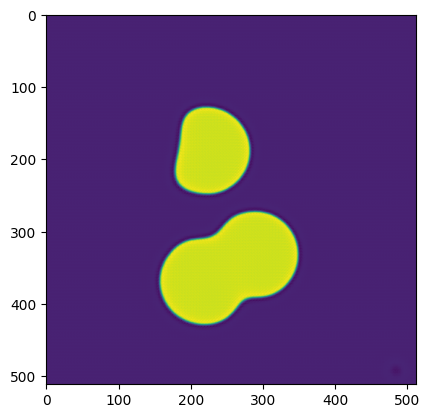

In [19]:
it = iter(ds_loader_train)
img, label = next(it)

model_no_skip.eval()

ret_no_skip = model_no_skip(img.to(device))
plt.imshow(ret_no_skip[1][0].detach().cpu().numpy())

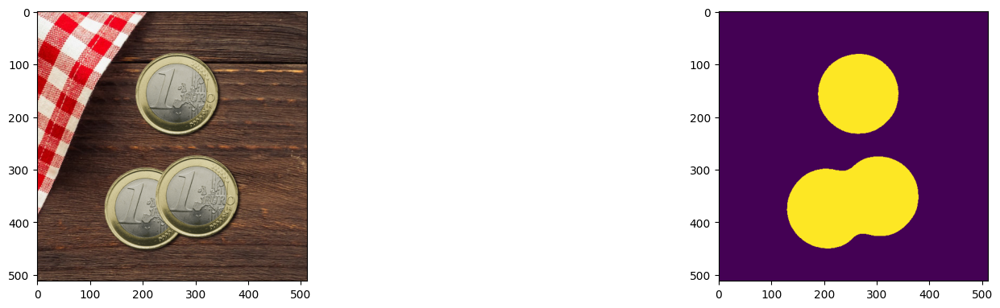

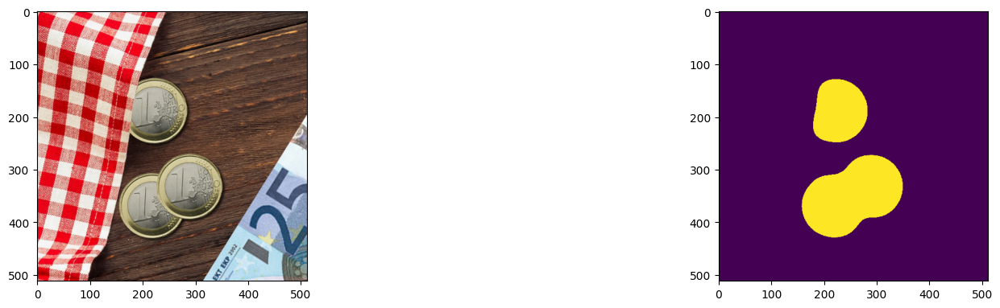

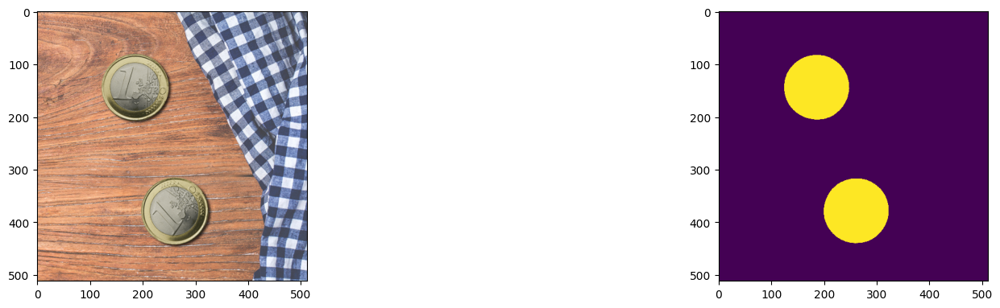

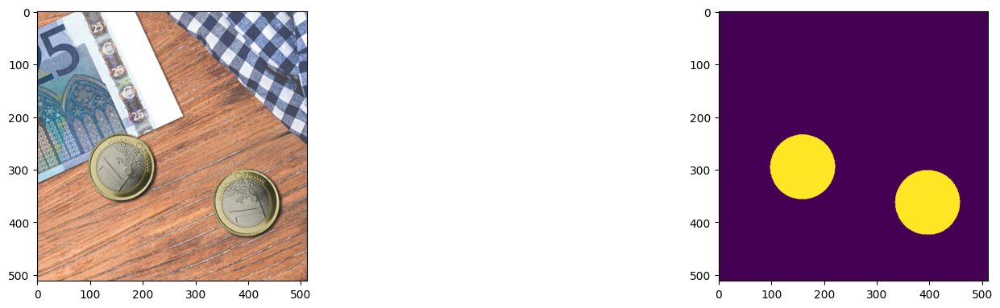

In [20]:
# Threshold the output
ret_no_skip = torch.round(ret_no_skip)

# Show a matrix of images of 4x2 
for i in range(4):
    # Size image
    plt.figure(figsize=(20, 20))
    plt.subplot(4, 2, 2*i+1)
    plt.imshow(img[i].permute(1, 2, 0).detach().cpu().numpy())
    plt.subplot(4, 2, 2*i+2)
    plt.imshow(ret_no_skip[i][0].detach().cpu().numpy())


In [21]:
torch.save(model_no_skip.state_dict(), "model_unet_coins.pth")

In [22]:
model_no_skip.load_state_dict(torch.load("model_unet_coins.pth"))

C:\Users\INES\AppData\Local\Temp\ipykernel_18088\3330449249.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_no_skip.load_state_dict(torch.load("model_unet_coins.pt

<All keys matched successfully>